<a href="https://colab.research.google.com/github/suhebmd/Funnel-Analysis-of-E-commerce-platform/blob/main/OCR_on_SBI_insurance_form.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!apt-get install poppler-utils

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 15 not upgraded.
Need to get 154 kB of archives.
After this operation, 613 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 poppler-utils amd64 0.62.0-2ubuntu2.12 [154 kB]
Fetched 154 kB in 1s (200 kB/s)
Selecting previously unselected package poppler-utils.
(Reading database ... 145480 files and directories currently installed.)
Preparing to unpack .../poppler-utils_0.62.0-2ubuntu2.12_amd64.deb ...
Unpacking poppler-utils (0.62.0-2ubuntu2.12) ...
Setting up poppler-utils (0.62.0-2ubuntu2.12) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...


In [ ]:
!pip install pdf2image
!pip install easyocr

     |████████████████████████████████| 57.2MB 56kB/s 


In [ ]:
from pdf2image import convert_from_path
import easyocr
import numpy as np
import PIL
from PIL import ImageDraw
import spacy

In [ ]:
#Detection model
reader = easyocr.Reader(['en'])

In [ ]:
#Get the document from google drive or any source by pasting the link
!wget https://drive.google.com/file/d/1fmdV0Wn1biSzxEC0CxqqsTXLt40_LYYN/view?usp=sharing

--2021-01-05 09:29:28--  https://drive.google.com/file/d/1fmdV0Wn1biSzxEC0CxqqsTXLt40_LYYN/view?usp=sharing
Resolving drive.google.com (drive.google.com)... 74.125.142.100, 74.125.142.138, 74.125.142.113, ...
Connecting to drive.google.com (drive.google.com)|74.125.142.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://accounts.google.com/ServiceLogin?service=wise&passive=1209600&continue=https://drive.google.com/file/d/1fmdV0Wn1biSzxEC0CxqqsTXLt40_LYYN/view?usp%3Dsharing&followup=https://drive.google.com/file/d/1fmdV0Wn1biSzxEC0CxqqsTXLt40_LYYN/view?usp%3Dsharing [following]
--2021-01-05 09:29:28--  https://accounts.google.com/ServiceLogin?service=wise&passive=1209600&continue=https://drive.google.com/file/d/1fmdV0Wn1biSzxEC0CxqqsTXLt40_LYYN/view?usp%3Dsharing&followup=https://drive.google.com/file/d/1fmdV0Wn1biSzxEC0CxqqsTXLt40_LYYN/view?usp%3Dsharing
Resolving accounts.google.com (accounts.google.com)... 74.125.20.84, 2607:f8b0:400

In [ ]:
#Locating the path in the google drive
#Open the link in browser and sign in using google account where the file is located , copy paste the code in the box below
from google.colab import drive 
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Copying the source directory
%cd /content/drive/My\ Drive

/content/drive/My Drive


In [ ]:
#Verifying the path
!pwd

/content/drive/My Drive


In [ ]:
#Showing contents in the drive
!ls

 sbidoc.pdf   SBI.pdf  'view?usp=sharing'  'view?usp=sharing.1'


In [ ]:
#converting the pdf to image
images = convert_from_path('SBI.pdf')


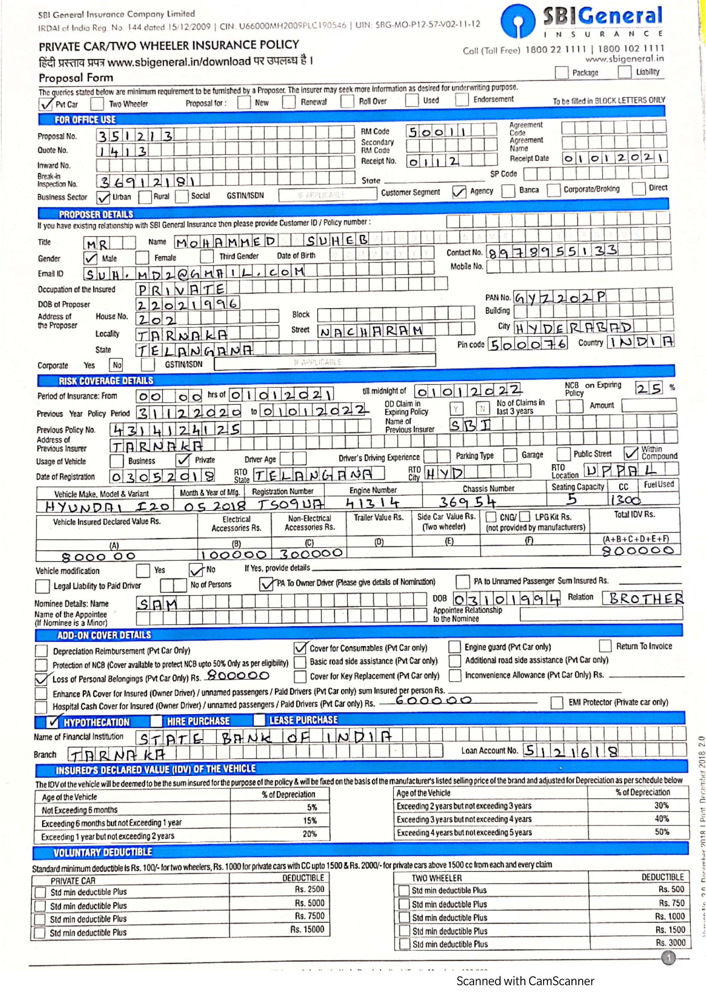

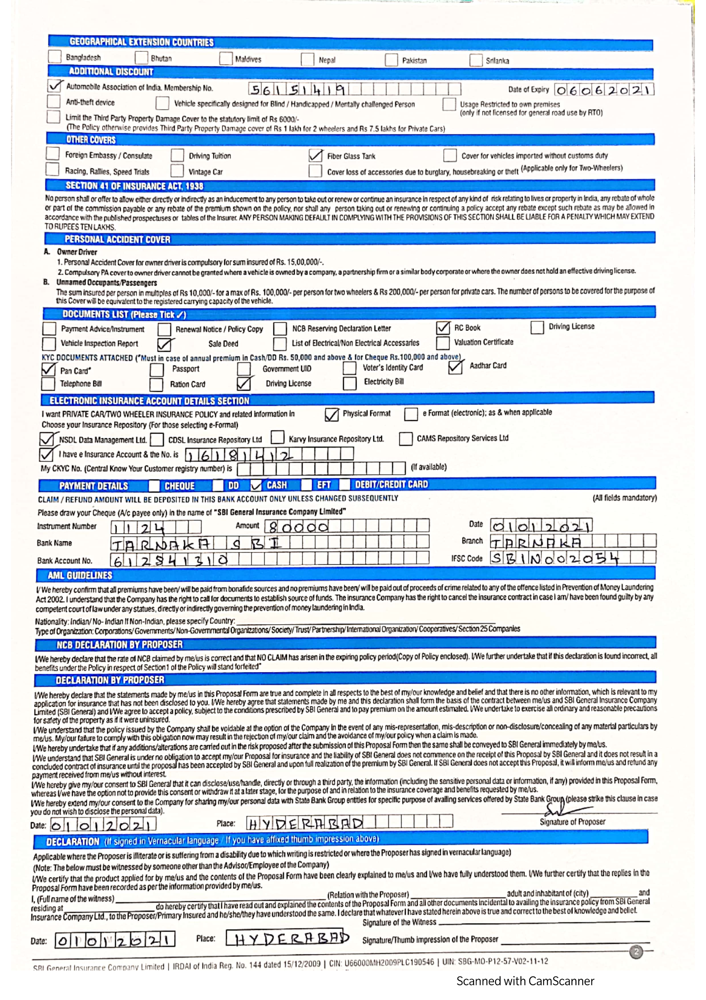

In [ ]:
#Displaying the converted image
from IPython.display import display, Image
display(images[0],images[1])

In [ ]:
#Setting parameters for the image #Default decoder is greedy
bounds = reader.readtext(np.array(images[0]), min_size=0, slope_ths=0.2, ycenter_ths=0.7, height_ths=0.6, width_ths=0.8,decoder='beamsearch', beamWidth=10)
bounds

[([[1265, 7], [1561, 7], [1561, 67], [1265, 67]],
  'SBIGeneral',
  0.6692891120910645),
 ([[86, 19], [460, 19], [460, 48], [86, 48]],
  'SCI Gcneral Insurance Company limited',
  0.027050169184803963),
 ([[828, 42], [1128, 42], [1128, 70], [828, 70]],
  "0IM: SBG-!40.P12-57-'02.1/.12",
  0.0004566491988953203),
 ([[510, 46], [816, 46], [816, 74], [510, 74]],
  'CII: 00600014/42009P!01905-6',
  0.0001970157027244568),
 ([[84, 50], [496, 50], [496, 78], [84, 78]],
  'IRDAl ol Indio Reg No IA4 dated |5/|2/2009',
  0.0016458164900541306),
 ([[1400, 66], [1556, 66], [1556, 90], [1400, 90]],
  'RANCE',
  0.15307894349098206),
 ([[1299, 71], [1317, 71], [1317, 91], [1299, 91]], 'N', 0.27313482761383057),
 ([[1367, 71], [1387, 71], [1387, 89], [1367, 89]], 'u', 0.8453869223594666),
 ([[1335, 73], [1353, 73], [1353, 89], [1335, 89]], 'S', 0.49802130460739136),
 ([[86, 86], [705, 86], [705, 126], [86, 126]],
  'PRIVATE CARIWO WHEELER INSURANCE POLICV',
  0.05036947876214981),
 ([[1080, 100], [1

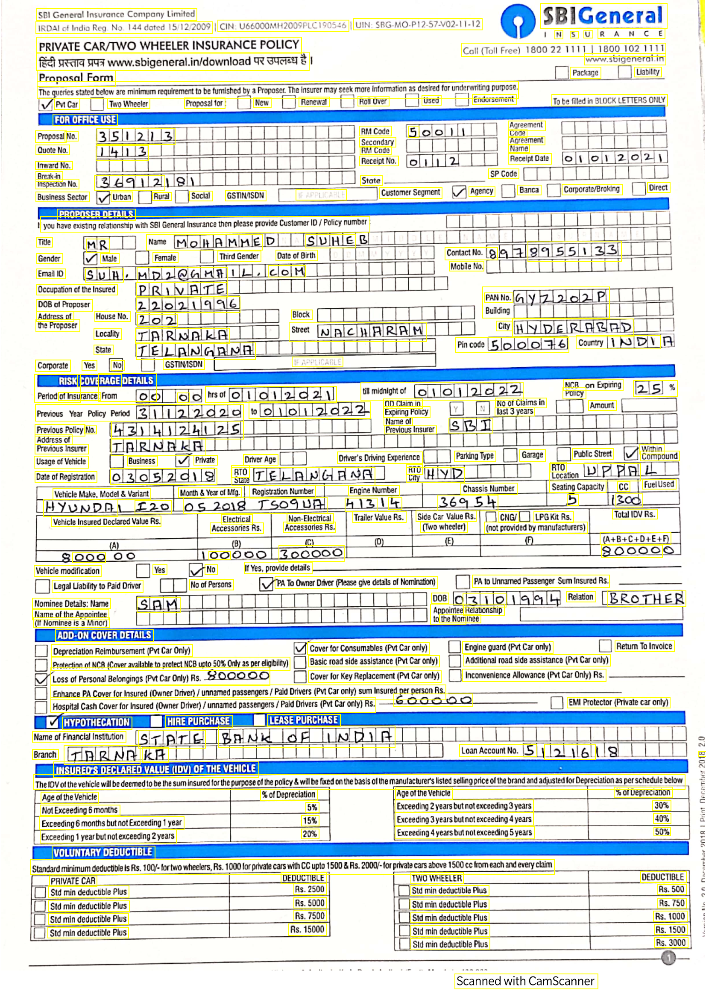

In [ ]:
#Drawing boundaries for the text
def draw_boxes(image, bounds, color='yellow', width=2):
    draw = ImageDraw.Draw(image)
    for bound in bounds:
        p0, p1, p2, p3 = bound[0]
        draw.line([*p0, *p1, *p2, *p3, *p0], fill=color, width=width)
    return image

draw_boxes(images[0], bounds)

In [ ]:
#Checking for the bounded text using any index number
bounds[1][1]

'SCI Gcneral Insurance Company limited'

In [ ]:
#Printing the recognized text
text=''
for i in range(len(bounds)):
  text = text + bounds[i][1] +'\n'

print(text)

SBIGeneral
SCI Gcneral Insurance Company limited
0IM: SBG-!40.P12-57-'02.1/.12
CII: 00600014/42009P!01905-6
IRDAl ol Indio Reg No IA4 dated |5/|2/2009
RANCE
N
u
S
PRIVATE CARIWO WHEELER INSURANCE POLICV
Call (Toll Free) 1800 22 1///|1800 102 1111
fel AHilq HqT www sbigeneral in/download q? 3qcicg*
www sbigeneral in
Package
Lability
Proposal Form
me quenes statcd belov a:e minimum requlemeni to be tumishcd by a Proposer The insurer may seck more intomation as deslied for underwnting pumase
Endarsement
To be filled in BIOCK LETTERS OMLV
Used
Rol Over
Rencwval
Pioposal lor
New
Pu Car
Tio Mnceler
FOR OFHICE USE
Agieement
RM Code
5
3lS2I
Cnde
Proposa
No.
Arreemenl
Secondary
Name
Quote No.
L
MII Code
Recelpl Dale
Receipt No.
Inward No.
SP Code
Breakin
z2
Stote
Inspection No.
Dlrect
Camorate eroklng
Banca
Agency
Cuslamer Scgmeni
# ;:1`1( ;:.':
GSIIIISDN
Social
Business Sector
Urban
Rurel
PROPOSGR DLnLS
lyou have existing relstionshup with SBl General Insurance then please provice Customer IO 

In [ ]:
#Performing entity recognition using spacy and choosing default language english
nlp=spacy.load('en_core_web_sm')

In [ ]:
doc = nlp(text)

In [ ]:
#Using Displacy to show the output in a rich format
from spacy import displacy

displacy.render(nlp(doc.text),style='ent', jupyter=True)